In [1]:
pip install librosa

   ---------------------------------------- 0.0/260.1 kB ? eta -:--:--
   ---- ----------------------------------- 30.7/260.1 kB ? eta -:--:--
   ------------------ --------------------- 122.9/260.1 kB 1.8 MB/s eta 0:00:01
   ------------------------------- -------- 204.8/260.1 kB 1.8 MB/s eta 0:00:01
   ---------------------------------------- 260.1/260.1 kB 1.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/301.8 kB ? eta -:--:--
   ---------------------------------------  297.0/301.8 kB 6.1 MB/s eta 0:00:01
   ---------------------------------------- 301.8/301.8 kB 6.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/74.9 kB ? eta -:--:--
   ---------------------------------------- 74.9/74.9 kB ? eta 0:00:00
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ------ --------------------------------- 0.4/2.7 MB 9.2 MB/s eta 0:00:01
   --------------- ------------------------ 1.1/2.7 MB 13.5 MB/s eta 0:00:01
   --------------------


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\Rajesh PC\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [4]:
pip install --upgrade pip

   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   -- ------------------------------------- 0.1/1.8 MB 1.3 MB/s eta 0:00:02
   ------- -------------------------------- 0.3/1.8 MB 2.7 MB/s eta 0:00:01
   ---------------------------- ----------- 1.3/1.8 MB 7.6 MB/s eta 0:00:01
   ---------------------------------------- 1.8/1.8 MB 8.9 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.0
    Uninstalling pip-24.0:
      Successfully uninstalled pip-24.0
Note: you may need to restart the kernel to use updated packages.


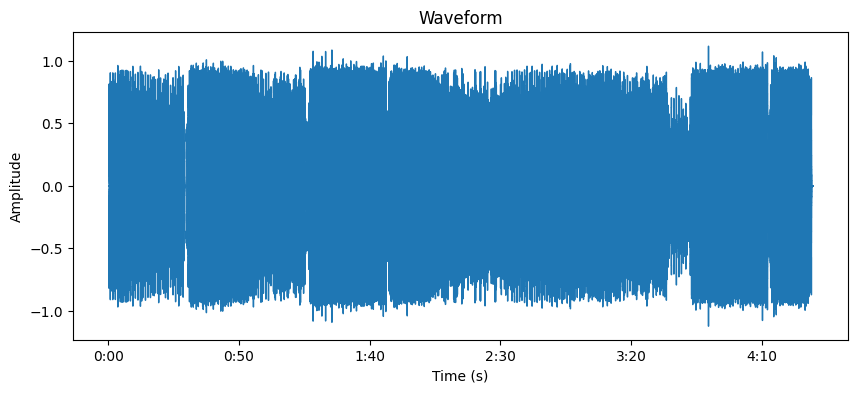

In [5]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load an audio file
y, sr = librosa.load("Solardo - Free Your Body.mp3", sr=22050)

# Display the waveform
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

In [ ]:
import librosa
from IPython.display import Audio

# Load the audio file
y, sr = librosa.load("Solardo - Free Your Body.mp3", sr=22050)

# Play the audio
Audio(y, rate=sr)

In [17]:
import pygame
import librosa
import numpy as np
import sounddevice as sd
import time

# Load the audio file and extract features
audio_file = "Solardo - Free Your Body.mp3"
y, sr = librosa.load(audio_file, sr=22050)

# Normalize audio
y = y / np.max(np.abs(y))

# Extract Mel spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=64)
mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
mel_spectrogram = np.interp(mel_spectrogram, (mel_spectrogram.min(), mel_spectrogram.max()), (0, 1))

# Convert spectrogram to frames
frames = mel_spectrogram.T
frame_count = frames.shape[0]
frequency_bands = frames.shape[1]

# Visualization settings
WIDTH, HEIGHT = 800, 600
bar_width = WIDTH // frequency_bands
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # RGB gradient

# Initialize Pygame
pygame.init()
screen = pygame.display.set_mode((WIDTH, HEIGHT))
pygame.display.set_caption("Real-Time Audio Visualizer")
clock = pygame.time.Clock()

# Function to handle drawing visuals
def draw_visuals(frame):
    screen.fill((0, 0, 0))  # Clear screen
    for i, amplitude in enumerate(frame):
        bar_height = int(amplitude * HEIGHT)
        color = colors[i % len(colors)]
        pygame.draw.rect(screen, color, (i * bar_width, HEIGHT - bar_height, bar_width - 2, bar_height))
    pygame.display.flip()

# Play audio and visualize simultaneously
def play_and_visualize():
    global running
    index = 0
    start_time = time.time()

    # Start audio playback
    sd.play(y, samplerate=sr)

    while running:
        # Handle Pygame events
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                running = False

        # Calculate the current frame index
        elapsed_time = time.time() - start_time
        frame_index = int(elapsed_time * sr / (len(y) / frame_count))

        if frame_index >= frame_count:
            running = False  # End visualization when audio ends
        else:
            frame = frames[frame_index]
            draw_visuals(frame)

        clock.tick(60)  # Control frame rate

    sd.stop()  # Stop audio playback

# Main program loop
running = True
play_and_visualize()
pygame.quit()

In [1]:
import pygame
import librosa
import numpy as np
import sounddevice as sd
import random
import math
import time
from IPython.display import display, clear_output

# Load the audio file and extract features
audio_file = "Solardo - Free Your Body.mp3"

try:
    y, sr = librosa.load(audio_file, sr=22050)
except Exception as e:
    print(f"Error loading audio file: {e}")
    exit()

# Normalize audio
y = y / np.max(np.abs(y))

# Extract beat and energy information
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
rms = librosa.feature.rms(y=y)[0]  # Energy

# Map beats to time
beat_times = librosa.frames_to_time(beats, sr=sr)

# Initialize Pygame
pygame.init()
WIDTH, HEIGHT = 800, 600
screen = pygame.display.set_mode((WIDTH, HEIGHT))
pygame.display.set_caption("3D Sphere Visualizer")
clock = pygame.time.Clock()

# Sphere settings
CENTER_X, CENTER_Y = WIDTH // 2, HEIGHT // 2
SPHERE_RADIUS = 150
PARTICLE_COUNT = 500
particles = []

# Generate particles on the surface of the sphere
for _ in range(PARTICLE_COUNT):
    theta = random.uniform(0, math.pi)  # Polar angle
    phi = random.uniform(0, 2 * math.pi)  # Azimuthal angle
    particles.append({"theta": theta, "phi": phi, "vibration": 0})

# Function to project 3D points onto the 2D screen
def project_3d_to_2d(radius, theta, phi):
    x = int(CENTER_X + radius * math.sin(theta) * math.cos(phi))
    y = int(CENTER_Y + radius * math.sin(theta) * math.sin(phi))
    return x, y

# Play audio and visualize
def play_and_visualize():
    global running
    start_time = time.time()
    beat_index = 0

    # Start audio playback
    sd.play(y, samplerate=sr)

    while running:
        # Clear the screen
        screen.fill((0, 0, 0))

        # Handle Pygame events
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                running = False

        # Calculate elapsed time
        elapsed_time = time.time() - start_time

        # Determine beat reaction
        if beat_index < len(beat_times) and elapsed_time >= beat_times[beat_index]:
            beat_index += 1
            beat = True
        else:
            beat = False

        # Calculate energy
        energy = rms[min(int(elapsed_time * sr / len(y) * len(rms)), len(rms) - 1)]

        # Update particles
        for particle in particles:
            # Vibrate particles perpendicular to their position
            vibration = energy * 10 + (5 if beat else 0)
            particle["vibration"] = random.uniform(-vibration, vibration)

            # Calculate particle position
            radius = SPHERE_RADIUS + particle["vibration"]
            theta = particle["theta"]
            phi = particle["phi"]

            # Project 3D to 2D
            x, y = project_3d_to_2d(radius, theta, phi)

            # Determine color based on energy
            color = (
                int(energy * 255),
                int((1 - energy) * 255),
                random.randint(100, 255) if beat else int(energy * 255),
            )

            # Draw particle
            pygame.draw.circle(screen, color, (x, y), 2)

        # Update the display
        pygame.display.update()

        # Control frame rate
        clock.tick(60)

    sd.stop()

# Main program loop
running = True
try:
    from IPython.display import display, clear_output
    while running:
        play_and_visualize()
except KeyboardInterrupt:
    running = False
pygame.quit()

pygame 2.6.1 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


UnboundLocalError: cannot access local variable 'y' where it is not associated with a value

In [1]:
import pygame
import librosa
import numpy as np
import random
import math
from moviepy.editor import VideoClip

# Load the audio file and extract features
audio_file = "Solardo - Free Your Body.mp3"

try:
    y, sr = librosa.load(audio_file, sr=22050)
except Exception as e:
    print(f"Error loading audio file: {e}")
    exit()

# Normalize audio
y = y / np.max(np.abs(y))

# Extract beat and energy information
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
rms = librosa.feature.rms(y=y)[0]  # Energy

# Map beats to time
beat_times = librosa.frames_to_time(beats, sr=sr)

# Screen settings
WIDTH, HEIGHT = 800, 600
SPHERE_RADIUS = 150
PARTICLE_COUNT = 500
particles = []

# Generate particles on the surface of the sphere
for _ in range(PARTICLE_COUNT):
    theta = random.uniform(0, math.pi)  # Polar angle
    phi = random.uniform(0, 2 * math.pi)  # Azimuthal angle
    particles.append({"theta": theta, "phi": phi, "vibration": 0})

# Function to project 3D points onto the 2D screen
def project_3d_to_2d(radius, theta, phi):
    x = int(WIDTH // 2 + radius * math.sin(theta) * math.cos(phi))
    y = int(HEIGHT // 2 + radius * math.sin(theta) * math.sin(phi))
    return x, y

# Function to generate frames
def make_frame(t):
    # Calculate elapsed time
    beat_index = next((i for i, bt in enumerate(beat_times) if bt > t), len(beat_times))
    beat = beat_index > 0 and beat_times[beat_index - 1] <= t
    energy = rms[min(int(t * sr / len(y) * len(rms)), len(rms) - 1)]

    # Create a Pygame surface
    pygame.init()
    screen = pygame.Surface((WIDTH, HEIGHT))
    screen.fill((0, 0, 0))

    # Update particles
    for particle in particles:
        # Vibrate particles perpendicular to their position
        vibration = energy * 10 + (5 if beat else 0)
        particle["vibration"] = random.uniform(-vibration, vibration)

        # Calculate particle position
        radius = SPHERE_RADIUS + particle["vibration"]
        theta = particle["theta"]
        phi = particle["phi"]

        # Project 3D to 2D
        x, y = project_3d_to_2d(radius, theta, phi)

        # Determine color based on energy
        color = (
            int(energy * 255),
            int((1 - energy) * 255),
            random.randint(100, 255) if beat else int(energy * 255),
        )

        # Draw particle
        pygame.draw.circle(screen, color, (x, y), 2)

    # Convert Pygame surface to a NumPy array
    return np.array(pygame.surfarray.array3d(screen)).transpose(1, 0, 2)

# Create a video using MoviePy
duration = len(y) / sr
animation = VideoClip(make_frame, duration=duration)
animation.write_videofile("sphere_visualizer.mp4", fps=30)

pygame 2.6.1 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html


ModuleNotFoundError: No module named 'moviepy.editor'

In [2]:
pip install ipykernel


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import librosa
import pandas as pd
import os
from tqdm import tqdm

def extract_mood_features(file_path):
    try:
        # Load audio file
        y, sr = librosa.load(file_path, sr=22050)

        # Extract features
        features = {
            "file_name": os.path.basename(file_path),
            "tempo": librosa.beat.tempo(y=y, sr=sr)[0],
            "energy": librosa.feature.rms(y=y).mean(),
            "spectral_centroid": librosa.feature.spectral_centroid(y=y, sr=sr).mean(),
            "spectral_bandwidth": librosa.feature.spectral_bandwidth(y=y, sr=sr).mean(),
            "spectral_rolloff": librosa.feature.spectral_rolloff(y=y, sr=sr).mean(),
            "zero_crossing_rate": librosa.feature.zero_crossing_rate(y=y).mean(),
        }

        # Extract chroma features to determine major/minor tonalities
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        features["chroma_mean"] = chroma.mean()

        # Extract MFCCs
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
        for i, mfcc in enumerate(mfccs):
            features[f"mfcc_{i+1}"] = mfcc.mean()

        # Valence proxy (higher spectral centroid -> higher valence)
        features["valence"] = features["spectral_centroid"] / 5000  # Normalize to [0, 1]

        # Arousal proxy (higher energy + tempo -> higher arousal)
        features["arousal"] = (features["energy"] * features["tempo"]) / 1000  # Normalize

        return features

    except Exception as e:
        print(f"Error processing {file_path}: {e}")
        return None


def process_audio_files(audio_dir, output_csv):
    data = []
    files = [f for f in os.listdir(audio_dir) if f.endswith(".wav") or f.endswith(".mp3")]

    # Use tqdm to show the progress bar
    for file_name in tqdm(files, desc="Extracting features", unit="file"):
        file_path = os.path.join(audio_dir, file_name)
        features = extract_mood_features(file_path)
        if features:
            data.append(features)

    # Convert to DataFrame
    df = pd.DataFrame(data)

    # Save to CSV
    df.to_csv(output_csv, index=False)
    print(f"Mood features extracted and saved to {output_csv}")

# Example usage
audio_directory = r"C:\Users\Rajesh PC\Downloads\MediaHuman\Music"  # Raw string
output_csv_file = "mood_features.csv"
process_audio_files(audio_directory, output_csv_file)

Extracting features:   0%|          | 0/660 [00:00<?, ?file/s]

C:\Users\Rajesh PC\AppData\Local\Temp\ipykernel_29912\626682844.py:14: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  "tempo": librosa.beat.tempo(y=y, sr=sr)[0],
Extracting features:  11%|█         | 70/660 [04:04<30:33,  3.11s/file]  

In [10]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.
